In [1]:
import sys
import regions
import pyavm
import numpy as np
import PIL

from astropy.io import fits
from astropy.wcs import WCS
from astropy.wcs.utils import proj_plane_pixel_scales
from astropy.visualization import simple_norm

import reproject 
from reproject.mosaicking import find_optimal_celestial_wcs, reproject_and_coadd
import matplotlib.pyplot as plt
from matplotlib.colors import rgb_to_hsv, hsv_to_rgb

from astropy.nddata import Cutout2D
from astropy.coordinates import SkyCoord
from astropy import units as u

from reproject import reproject_interp

from spectral_cube import SpectralCube
from spectral_cube import Projection

from photutils.background import MMMBackground, MADStdBackgroundRMS, Background2D
from photutils import background

import regions
import cv2

from astropy.visualization.wcsaxes import add_scalebar
from astropy.visualization.wcsaxes import add_beam

import random as rand

from astropy.table import Table

In [2]:
from pvextractor import Path, extract_pv_slice

In [3]:
print('test')

test


In [4]:
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams['image.origin'] = 'lower'

In [5]:
basepath = '/orange/adamginsburg/jwst/cloudc/'

# Useful Functions

In [6]:
def get_cutout(filename, position, l, w, format='fits'):
    if format == 'fits':
        try: 
            hdu = fits.open(filename, ext='SCI')[0]
        except: 
            hdu = fits.open(filename)[0]
    elif format == 'casa':
        hdu = SpectralCube.read(filename, format='casa').hdu
    data = np.squeeze(hdu.data)
    head = hdu.header

    #pixel_scale = head['PIXSCALE']*u.arcsec/u.pix
    ww = WCS(head).celestial
    size = (l, w)
    #((l/pixel_scale).to(u.pix), (w/pixel_scale).to(u.pix))
    cutout = Cutout2D(data, position=position, size=size, wcs=ww)
    return cutout


In [7]:
B3_cont_fn = '/orange/adamginsburg/jwst/cloudc/alma/ACES/uid___A001_X15a0_X1a8.s36_0.Sgr_A_star_sci.spw33_35.cont.I.iter1.image.tt0'

def get_percentile_list(data, percents=[98, 99, 99.9, 99.99]):
    #[87, 95, 99, 99.5, 99.9, 99.99]
    arr = []
    for per in percents:
        arr.append(np.nanpercentile(data, per))
    return np.array(arr)

def get_sio_mom0_filament(position, l, w):
    SiO_mom0_fn_lowv = '/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_SiO_B3_n60_n55.fits'
    SiO_mom0_fn_highv = '/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_SiO_B3_n55_n50.fits'
    cutout_lowv = get_cutout(SiO_mom0_fn_lowv, position, l, w)
    cutout_highv = get_cutout(SiO_mom0_fn_highv, position, l, w)
    return cutout_lowv, cutout_highv

def get_cs_mom0_filament(position, l, w):
    SiO_mom0_fn_lowv = '/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_CS_B3_n60_n55.fits'
    SiO_mom0_fn_highv = '/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_CS_B3_n55_n50.fits'
    cutout_lowv = get_cutout(SiO_mom0_fn_lowv, position, l, w)
    cutout_highv = get_cutout(SiO_mom0_fn_highv, position, l, w)
    return cutout_lowv, cutout_highv

def plot_sio_mom0_filament(ax, position, l, w, percents=[70, 80, 90, 95, 98]):
    cutout_lowv, cutout_highv = get_sio_mom0_filament(position, l, w)
    
    ax.contour(cutout_highv.data, transform=ax.get_transform(cutout_highv.wcs), 
               levels=get_percentile_list(cutout_highv.data, percents=percents), 
               colors='red', linewidths=1.)
    ax.contour(cutout_lowv.data, transform=ax.get_transform(cutout_lowv.wcs), 
               levels=get_percentile_list(cutout_lowv.data, percents=percents), 
               colors='blue', linewidths=1.)
    add_beam(ax, header=SpectralCube.read(B3_cont_fn, format='casa').hdu.header, corner='bottom right', color='k', linestyle='dashed', facecolor='none')
    
def plot_cs_mom0_filament(ax, position, l, w, percents=[70, 80, 90, 95, 98]):
    cutout_lowv, cutout_highv = get_cs_mom0_filament(position, l, w)
    
    ax.contour(cutout_highv.data, transform=ax.get_transform(cutout_highv.wcs), 
               levels=get_percentile_list(cutout_highv.data, percents=percents), 
               colors='red', linewidths=.5)
    ax.contour(cutout_lowv.data, transform=ax.get_transform(cutout_lowv.wcs), 
               levels=get_percentile_list(cutout_lowv.data, percents=percents), 
               colors='blue', linewidths=.5)
    add_beam(ax, header=SpectralCube.read(B3_cont_fn, format='casa').hdu.header, corner='bottom right', color='k', linestyle='dashed', facecolor='none')

def get_alma_B3(position, l, w):
    B3_cont_fn = '/orange/adamginsburg/jwst/cloudc/alma/ACES/uid___A001_X15a0_X1a8.s36_0.Sgr_A_star_sci.spw33_35.cont.I.iter1.image.tt0'
    cutout_alma = get_cutout(B3_cont_fn, position, l, w, format='casa')
    return cutout_alma

def plot_alma_B3(ax, position, l, w, percents=[90, 95, 97, 98], color='k'):
    cutout_alma = get_alma_B3(position, l, w)
    ax.contour(cutout_alma.data, transform=ax.get_transform(cutout_alma.wcs), 
               levels=get_percentile_list(cutout_alma.data, percents=percents), 
               colors=color, linewidths=1)
    add_beam(ax, header=SpectralCube.read(B3_cont_fn, format='casa').hdu.header, corner='bottom right', color=color, linestyle='dashed', facecolor='none')

def get_cutout_rgb(position, l, w):
    #filename_R = '/orange/adamginsburg/jwst/cloudc/images/F405_reproj_merged-fortricolor.fits'
    filename_R = '/orange/adamginsburg/jwst/cloudc/images/F466_reproj_merged-fortricolor.fits'
    #filename_B = '/orange/adamginsburg/jwst/cloudc/images/F187_reproj_merged-fortricolor.fits'
    filename_B = '/orange/adamginsburg/jwst/cloudc/images/F405_reproj_merged-fortricolor.fits'
    cutout_R = get_cutout(filename_R, position, l, w)
    cutout_B = get_cutout(filename_B, position, l, w)
    cutout_G = cutout_R.data + cutout_B.data
    rgb = np.array(
        [
            cutout_R.data,
            cutout_G,
            cutout_B.data
        ]
    ).swapaxes(0,2).swapaxes(0,1)
    rgb_scaled = np.array([
        simple_norm(rgb[:,:,0], stretch='asinh', min_cut=-1, max_cut=90)(rgb[:,:,0]),
        simple_norm(rgb[:,:,1], stretch='asinh', min_cut=-2, max_cut=210)(rgb[:,:,1]),
        simple_norm(rgb[:,:,2], stretch='asinh', min_cut=-1, max_cut=120)(rgb[:,:,2]),
    ]).swapaxes(0,2)
    return rgb_scaled.swapaxes(0,1), cutout_R.wcs

def get_cutout_rgb3(position, l, w):
    #filename_R = '/orange/adamginsburg/jwst/cloudc/images/F405_reproj_merged-fortricolor.fits'
    filename_R = '/orange/adamginsburg/jwst/cloudc/images/F410_reproj_merged-fortricolor.fits'
    filename_G = '/orange/adamginsburg/jwst/cloudc/images/F212_reproj_merged-fortricolor.fits'
    filename_B = '/orange/adamginsburg/jwst/cloudc/images/F182_reproj_merged-fortricolor.fits'
    cutout_R = get_cutout(filename_R, position, l, w)
    cutout_G = get_cutout(filename_G, position, l, w)
    cutout_B = get_cutout(filename_B, position, l, w)
    
    rgb = np.array(
        [
            cutout_R.data,
            cutout_G.data,
            cutout_B.data
        ]
    ).swapaxes(0,2).swapaxes(0,1)
    rgb_scaled = np.array([
        simple_norm(rgb[:,:,0], stretch='asinh', min_cut=-1, max_cut=150)(rgb[:,:,0]),
        simple_norm(rgb[:,:,1], stretch='asinh', min_cut=-2, max_cut=210)(rgb[:,:,1]),
        simple_norm(rgb[:,:,2], stretch='asinh', min_cut=-1, max_cut=120)(rgb[:,:,2]),
    ]).swapaxes(0,2)
    return rgb_scaled.swapaxes(0,1), cutout_R.wcs

# Positions

In [8]:
clump1 = SkyCoord('17:46:19.2287619119', '-28:38:29.2978617171', unit=(u.hourangle, u.deg))
clump2 = SkyCoord('17:46:19.5945777603', '-28:38:09.9402161687', unit=(u.hourangle, u.deg))
clump3 = SkyCoord('17:46:22.0252976019', '-28:37:41.3736076102', unit=(u.hourangle, u.deg))

In [9]:
cutout_clump1 = get_alma_B3(clump1, 25*u.arcsec, 25*u.arcsec)
cutout_clump1_rgb = get_cutout_rgb(clump1, 5*u.arcsec, 5*u.arcsec)
cutout_clump1_rgb3 = get_cutout_rgb3(clump1, 5*u.arcsec, 5*u.arcsec)
cutout_clump2 = get_alma_B3(clump2, 22*u.arcsec, 22*u.arcsec)
cutout_clump2_rgb = get_cutout_rgb(clump2, 5*u.arcsec, 5*u.arcsec)
cutout_clump2_rgb3 = get_cutout_rgb3(clump2, 5*u.arcsec, 5*u.arcsec)
cutout_clump3 = get_alma_B3(clump3, 25*u.arcsec, 25*u.arcsec)
cutout_clump3_rgb = get_cutout_rgb(clump3, 5*u.arcsec, 5*u.arcsec)
cutout_clump3_rgb3 = get_cutout_rgb3(clump3, 5*u.arcsec, 5*u.arcsec)

/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in long_scalars
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]
/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in long_scalars
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]
/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in long_scalars
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]


In [10]:
pos_ctr = SkyCoord('17:46:20.9063719501', '-28:37:51.6942550990', unit=(u.hourangle, u.deg))
#SkyCoord('17:46:20.5098134312', '-28:37:50.9694197729', unit=(u.hourangle, u.deg))
l = 3*u.arcmin#2.0*u.arcmin
w = 1.3*u.arcmin#1.0*u.arcmin

In [134]:
pos_cloudc1 = SkyCoord('17:46:21.3048683891', '-28:35:33.1211282499', unit=(u.hourangle, u.deg))
pos_cloudc2 = SkyCoord('17:46:18.3316118680', '-28:34:48.4717811920', unit=(u.hourangle, u.deg))

pos_cloudd = SkyCoord('17:46:22.6563371259', '-28:33:27.5405071803', unit=(u.hourangle, u.deg))

# Cutouts

/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in long_scalars
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]


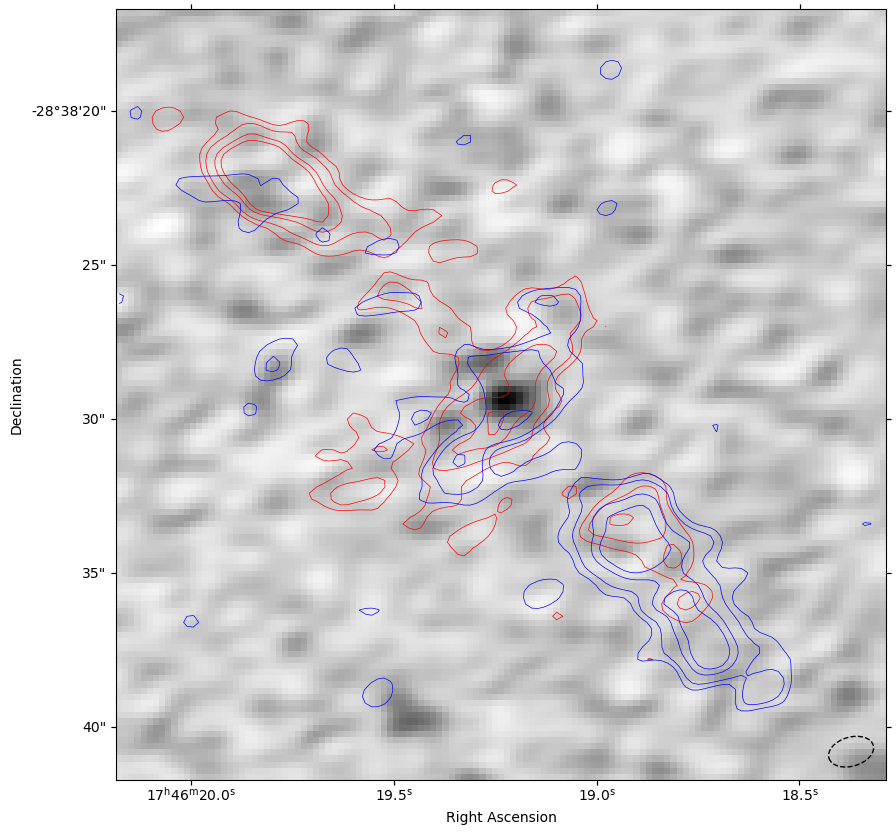

In [11]:
plt.figure(figsize=(24,10))
ax = plt.subplot(111, projection=cutout_clump1.wcs)#, origin='lower')
ax.imshow(cutout_clump1.data, cmap='Greys')

plot_cs_mom0_filament(ax, clump1, 25*u.arcsec, 25*u.arcsec, percents=[90, 95, 98, 99])

ax.set_ylabel('Declination')
ax.set_xlabel('Right Ascension')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in long_scalars
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]
/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in long_scalars
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]


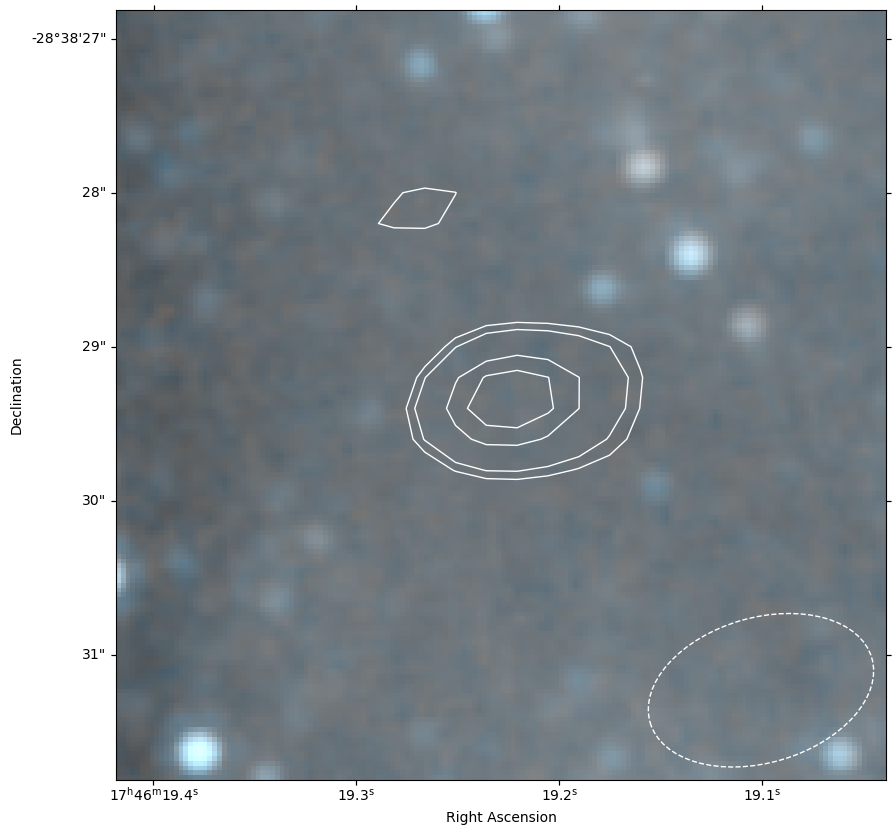

In [12]:
plt.figure(figsize=(24,10))
ax = plt.subplot(111, projection=cutout_clump1_rgb[1])#, origin='lower')
ax.imshow(cutout_clump1_rgb[0])

#plot_cs_mom0_filament(ax, clump1, 25*u.arcsec, 25*u.arcsec, percents=[90, 95, 98, 99])
plot_alma_B3(ax, clump1, 4.5*u.arcsec, 4.5*u.arcsec, percents=[93, 95, 98, 99], color='white')

ax.set_ylabel('Declination')
ax.set_xlabel('Right Ascension')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in long_scalars
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]
/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in long_scalars
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]


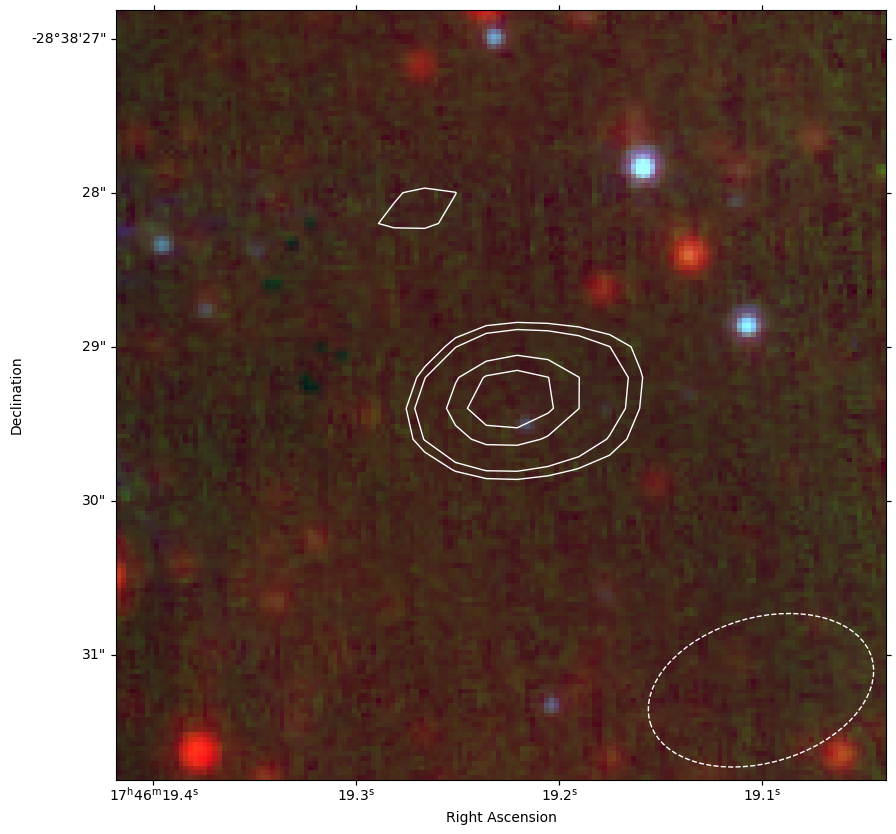

In [13]:
plt.figure(figsize=(24,10))
ax = plt.subplot(111, projection=cutout_clump1_rgb3[1])#, origin='lower')
ax.imshow(cutout_clump1_rgb3[0])

#plot_cs_mom0_filament(ax, clump1, 25*u.arcsec, 25*u.arcsec, percents=[90, 95, 98, 99])
plot_alma_B3(ax, clump1, 4.5*u.arcsec, 4.5*u.arcsec, percents=[93, 95, 98, 99], color='white')


ax.set_ylabel('Declination')
ax.set_xlabel('Right Ascension')


/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in long_scalars
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]


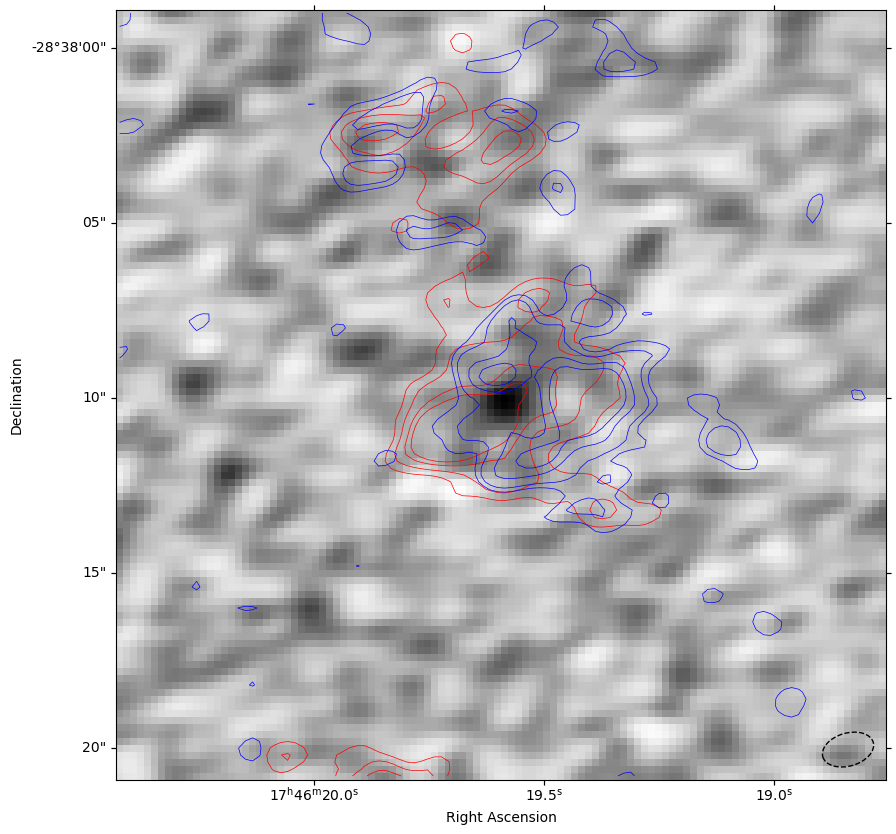

In [14]:
plt.figure(figsize=(24,10))
ax = plt.subplot(111, projection=cutout_clump2.wcs)#, origin='lower')
ax.imshow(cutout_clump2.data, cmap='Greys')

plot_cs_mom0_filament(ax, clump2, 22*u.arcsec, 22*u.arcsec, percents=[90, 95, 98, 99])

ax.set_ylabel('Declination')
ax.set_xlabel('Right Ascension')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in long_scalars
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]
/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in long_scalars
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]


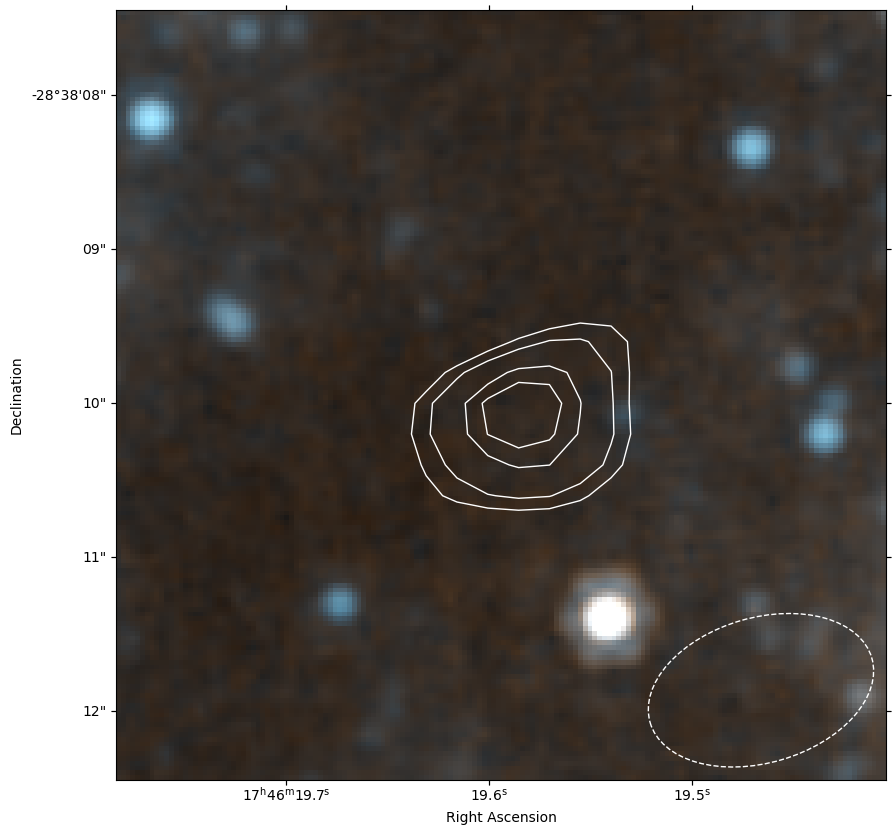

In [15]:
plt.figure(figsize=(24,10))
ax = plt.subplot(111, projection=cutout_clump2_rgb[1])#, origin='lower')
ax.imshow(cutout_clump2_rgb[0])

#plot_cs_mom0_filament(ax, clump1, 25*u.arcsec, 25*u.arcsec, percents=[90, 95, 98, 99])
plot_alma_B3(ax, clump2, 4.5*u.arcsec, 4.5*u.arcsec, percents=[93, 95, 98, 99], color='white')

ax.set_ylabel('Declination')
ax.set_xlabel('Right Ascension')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in long_scalars
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]
/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in long_scalars
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]


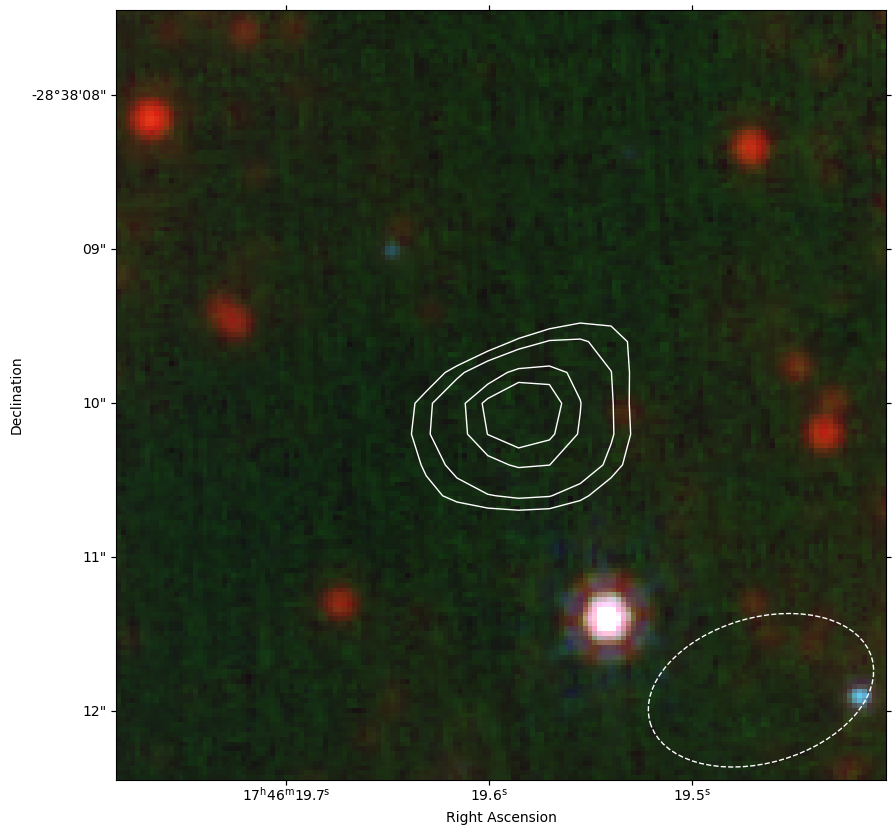

In [16]:
plt.figure(figsize=(24,10))
ax = plt.subplot(111, projection=cutout_clump2_rgb3[1])#, origin='lower')
ax.imshow(cutout_clump2_rgb3[0])

#plot_cs_mom0_filament(ax, clump1, 25*u.arcsec, 25*u.arcsec, percents=[90, 95, 98, 99])
plot_alma_B3(ax, clump2, 4.5*u.arcsec, 4.5*u.arcsec, percents=[93, 95, 98, 99], color='white')

ax.set_ylabel('Declination')
ax.set_xlabel('Right Ascension')


# Filament

In [17]:
ang = (0.5*u.pc/(5*u.kpc)).to(u.arcmin, equivalencies=u.dimensionless_angles())
ang

<Quantity 0.34377468 arcmin>

/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in long_scalars
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]


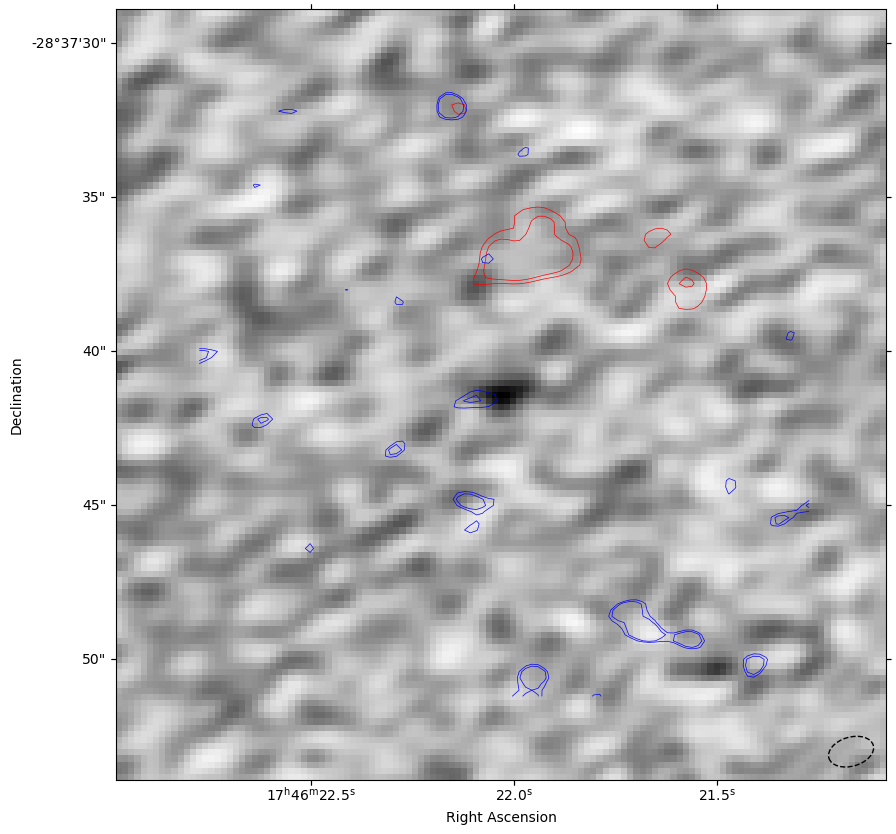

In [18]:
plt.figure(figsize=(24,10))
ax = plt.subplot(111, projection=cutout_clump3.wcs)#, origin='lower')
ax.imshow(cutout_clump3.data, cmap='Greys')

plot_cs_mom0_filament(ax, clump3, 20*u.arcsec, 20*u.arcsec, percents=[98, 99])

ax.set_ylabel('Declination')
ax.set_xlabel('Right Ascension')


In [19]:
rgb_data, rgb_wcs = get_cutout_rgb(pos_ctr, l, w)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in long_scalars
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]
/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in long_scalars
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]


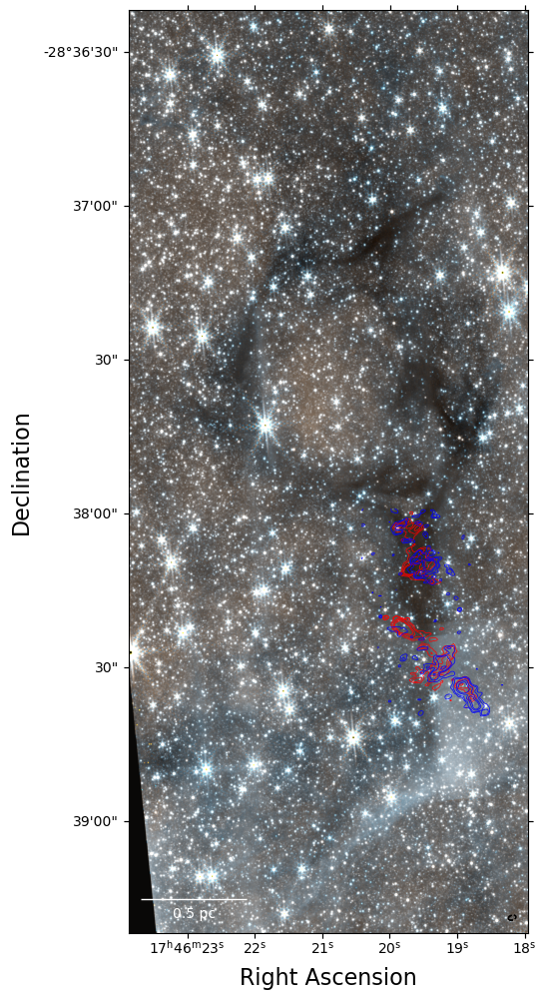

In [20]:
plt.figure(figsize=(16,12))
ax = plt.subplot(111, projection=rgb_wcs)#, origin='lower')
ax.imshow(rgb_data)

plot_cs_mom0_filament(ax, clump1, 25*u.arcsec, 25*u.arcsec, percents=[90, 95, 98, 99])
plot_cs_mom0_filament(ax, clump2, 22*u.arcsec, 22*u.arcsec, percents=[90, 95, 98, 99])

ax.set_ylabel('Declination', fontproperties={"size": 16})
ax.set_xlabel('Right Ascension', fontproperties={"size": 16})
add_scalebar(ax, u.Quantity(ang), label="0.5 pc", color='white', fontproperties={"size": 10}, corner='bottom left')

# Multi-panel Figure

In [21]:
smal_ang = (10000*u.AU/(5*u.kpc)).to(u.arcsec, equivalencies=u.dimensionless_angles())
smal_ang

<Quantity 2. arcsec>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in long_scalars
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]
/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in long_scalars
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero encountered in long_scalars
  factors = [f for f in range(stacks[dim] + 1) if stacks[dim] % f == 0]
/blue/adamginsburg/adamginsburg/repos/casa-formats-io/casa_formats_io/casa_dask.py:247: RuntimeWarning: divide by zero enco

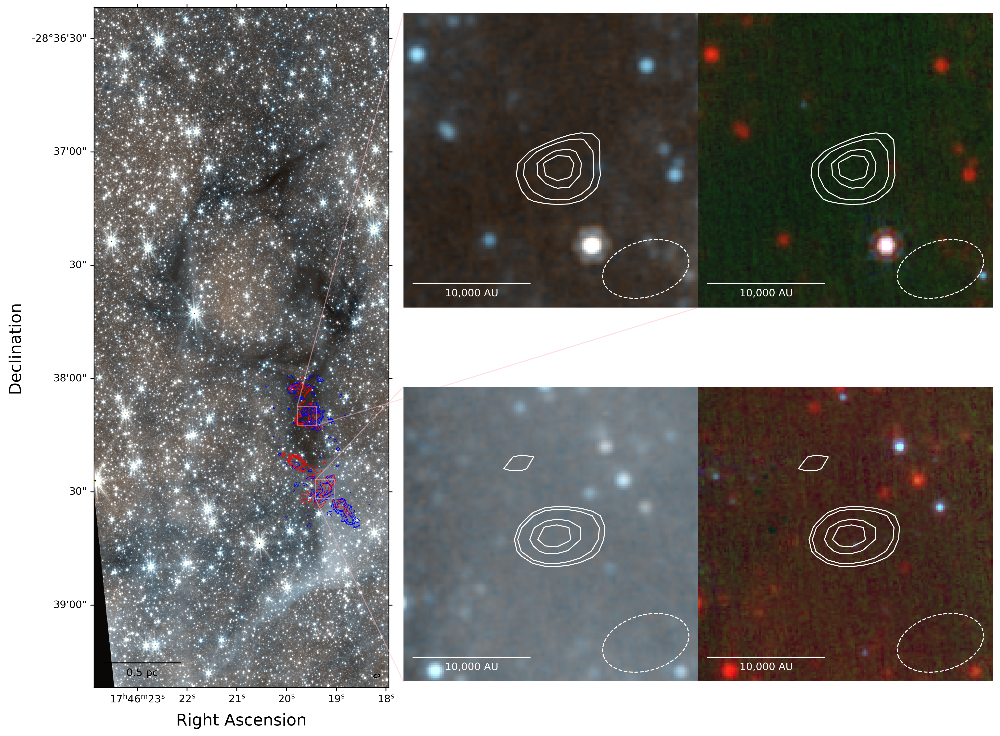

In [22]:
plt.figure(figsize=(16,12), dpi=300)
ax = plt.subplot(111, projection=rgb_wcs)#, origin='lower')
ax.imshow(rgb_data)


plot_cs_mom0_filament(ax, clump1, 25*u.arcsec, 25*u.arcsec, percents=[90, 95, 98, 99])
plot_cs_mom0_filament(ax, clump2, 22*u.arcsec, 22*u.arcsec, percents=[90, 95, 98, 99])

ax.set_ylabel('Declination', fontproperties={"size": 16})
ax.set_xlabel('Right Ascension', fontproperties={"size": 16})
add_scalebar(ax, u.Quantity(ang), label="0.5 pc", color='k', fontproperties={"size": 10}, corner='bottom left')

ins_ax_1 = ax.inset_axes([1.05, 0., 1, .45], projection=cutout_clump1_rgb[1])
ins_ax_1.imshow(cutout_clump1_rgb[0])
plot_alma_B3(ins_ax_1, clump1, 4.5*u.arcsec, 4.5*u.arcsec, percents=[93, 95, 98, 99], color='white')
ins_ax_1.set_axis_off()
pos1 = SkyCoord.to_pixel(clump1, wcs=rgb_wcs)
pixelscale = u.pixel_scale(proj_plane_pixel_scales(cutout_clump1_rgb[1])[0]*u.deg/u.pix)
dx = (5*u.arcsec).to(u.pix, pixelscale).value
add_scalebar(ins_ax_1, u.Quantity(smal_ang), label="10,000 AU", color='white', fontproperties={"size": 10}, corner='bottom left')
ax.indicate_inset(bounds=[pos1[0]-dx/2, pos1[1]-dx/2, dx, dx], inset_ax=ins_ax_1, edgecolor='pink')

ins_ax_3 = ax.inset_axes([2.05, 0, 1, .45], projection=cutout_clump1_rgb3[1])
ins_ax_3.imshow(cutout_clump1_rgb3[0])
plot_alma_B3(ins_ax_3, clump1, 4.5*u.arcsec, 4.5*u.arcsec, percents=[93, 95, 98, 99], color='white')
ins_ax_3.set_axis_off()
pos3 = SkyCoord.to_pixel(clump1, wcs=rgb_wcs)
pixelscale = u.pixel_scale(proj_plane_pixel_scales(cutout_clump1_rgb3[1])[0]*u.deg/u.pix)
dx = (5*u.arcsec).to(u.pix, pixelscale).value
add_scalebar(ins_ax_3, u.Quantity(smal_ang), label="10,000 AU", color='white', fontproperties={"size": 10}, corner='bottom left')

ins_ax_2 = ax.inset_axes([1.05, 0.55, 1, .45], projection=cutout_clump2_rgb[1])
ins_ax_2.imshow(cutout_clump2_rgb[0])
plot_alma_B3(ins_ax_2, clump2, 4.5*u.arcsec, 4.5*u.arcsec, percents=[93, 95, 98, 99], color='white')
ins_ax_2.set_axis_off()
pos2 = SkyCoord.to_pixel(clump2, wcs=rgb_wcs)
pixelscale = u.pixel_scale(proj_plane_pixel_scales(cutout_clump2_rgb[1])[0]*u.deg/u.pix)
dx = (5*u.arcsec).to(u.pix, pixelscale).value
add_scalebar(ins_ax_2, u.Quantity(smal_ang), label="10,000 AU", color='white', fontproperties={"size": 10}, corner='bottom left')
ax.indicate_inset(bounds=[pos2[0]-dx/2, pos2[1]-dx/2, dx, dx], inset_ax=ins_ax_2, edgecolor='pink')

ins_ax_4 = ax.inset_axes([2.05, 0.55, 1, .45], projection=cutout_clump2_rgb3[1])
ins_ax_4.imshow(cutout_clump2_rgb3[0])
plot_alma_B3(ins_ax_4, clump2, 4.5*u.arcsec, 4.5*u.arcsec, percents=[93, 95, 98, 99], color='white')
ins_ax_4.set_axis_off()
pos4 = SkyCoord.to_pixel(clump2, wcs=rgb_wcs)
pixelscale = u.pixel_scale(proj_plane_pixel_scales(cutout_clump2_rgb3[1])[0]*u.deg/u.pix)
dx = (5*u.arcsec).to(u.pix, pixelscale).value
add_scalebar(ins_ax_4, u.Quantity(smal_ang), label="10,000 AU", color='white', fontproperties={"size": 10}, corner='bottom left')

#plt.savefig('/orange/adamginsburg/jwst/cloudc/figures/jwst_zoom_filament_rgb.pdf', bbox_inches='tight')

In [23]:
basepath

'/orange/adamginsburg/jwst/cloudc/'

# Moments

In [24]:
def get_moment0(restfreq, vmin, vmax, filename):
    cube = SpectralCube.read(filename)
    subcube = cube.with_spectral_unit(u.km/u.s, velocity_convention='radio', rest_value=restfreq).spectral_slab(vmin, vmax)
    subcube.allow_huge_operations = True
    mom0 = subcube.to(u.K).moment0()
    mom0.allow_huge_operations = True
    return mom0

def get_mom0_cutout(pos, l, w, mom0):
    data = np.squeeze(mom0.data)
    head = mom0.header
    ww = WCS(head).celestial
    size = (l, w)

    cutout = Cutout2D(data, position=pos, size=size, wcs=ww)
    return cutout

def plot_mom0_cutout(pos, l, w, line, vmin, vmax):
    spec_tab = Table.read(f'{basepath}/analysis/linelist.csv')
    mol = spec_tab[spec_tab['Line']==line]
    restfreq = mol['Rest (GHz)'].data[0]*u.GHz
    spw = mol['12m SPW'].data[0]
    cube_fn = f'{basepath}/alma/ACES/uid___A001_X15a0_X1a8.s38_0.Sgr_A_star_sci.spw{spw}.cube.I.iter1.image.pbcor.fits'

    mom0 = get_moment0(restfreq, vmin, vmax, cube_fn)
    mom0_cutout = get_mom0_cutout(pos, l, w, mom0)

    fig = plt.figure(figsize=(8,6))
    ax = plt.subplot(111, projection=mom0_cutout.wcs)
    im = ax.imshow(mom0_cutout.data, cmap='Greys', vmin=0)

    ax.set_xlabel('Right Ascension')
    ax.set_ylabel('Declination')
    ax.set_title(line)

    cbar = plt.colorbar(im)
    cbar.set_label('Integrated Intensity (K km/s)')

    return mom0


In [25]:
ls /orange/adamginsburg/jwst/cloudc/alma/ACES/*cube*

 /orange/adamginsburg/jwst/cloudc/alma/ACES/uid___A001_X15a0_X1a8.s38_0.Sgr_A_star_sci.spw25.cube.I.iter1.image.pbcor.fits@
'/orange/adamginsburg/jwst/cloudc/alma/ACES/uid___A001_X15a0_X1a8.s38_0.Sgr_A_star_sci.spw25.cube.I.iter1.image.pbcor_SiO_2-1_v=1_maser_max.fits'@
 /orange/adamginsburg/jwst/cloudc/alma/ACES/uid___A001_X15a0_X1a8.s38_0.Sgr_A_star_sci.spw27.cube.I.iter1.image.pbcor.fits@
 /orange/adamginsburg/jwst/cloudc/alma/ACES/uid___A001_X15a0_X1a8.s38_0.Sgr_A_star_sci.spw29.cube.I.iter1.image.pbcor.fits@
 /orange/adamginsburg/jwst/cloudc/alma/ACES/uid___A001_X15a0_X1a8.s38_0.Sgr_A_star_sci.spw31.cube.I.iter1.image.pbcor.fits@
 /orange/adamginsburg/jwst/cloudc/alma/ACES/uid___A001_X15a0_X1a8.s38_0.Sgr_A_star_sci.spw33.cube.I.iter1.image.pbcor.fits@
 /orange/adamginsburg/jwst/cloudc/alma/ACES/uid___A001_X15a0_X1a8.s38_0.Sgr_A_star_sci.spw35.cube.I.iter1.image.pbcor.fits@


In [26]:
spec_tab = Table.read(f'{basepath}/analysis/linelist.csv')
lines = spec_tab['Line']
mol = spec_tab[spec_tab['Line']=='CS 2-1']
mol

Band Name,TP SPW,7m SPW,12m SPW,Center,Bandwidth,F_Lower,F_Upper,F_Resolution,col9,Line,Rest (GHz),V_Lower,V_Upper,V_Res.,_1,References
str10,int64,int64,int64,float64,float64,float64,float64,float64,str3,str27,float64,float64,float64,float64,int64,str30
Cont 1,25,24,33,98.6,1.875,97.6625,99.5375,0.000976563,***,CS 2-1,97.98095,--,--,2.99,--,--


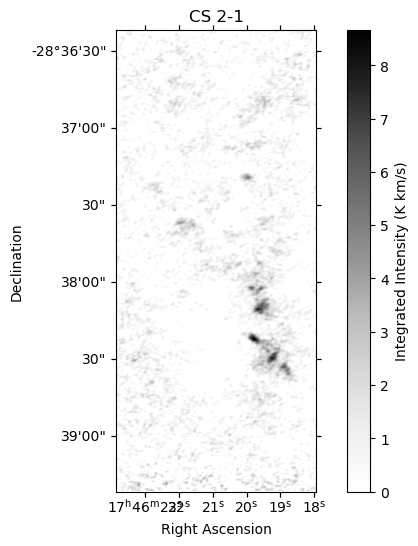

In [27]:
spec_tab = Table.read(f'{basepath}/analysis/linelist.csv')
lines = spec_tab['Line']
mol = spec_tab[spec_tab['Line']=='CS 2-1']
spw = mol['12m SPW'][0]
fn = f'/orange/adamginsburg/jwst/cloudc/alma/ACES/uid___A001_X15a0_X1a8.s38_0.Sgr_A_star_sci.spw{spw}.cube.I.iter1.image.pbcor.fits'
mom0_CS = get_moment0(mol['Rest (GHz)']*u.GHz, -56*u.km/u.s, -52*u.km/u.s, fn)
mom0_CS_cutout = get_mom0_cutout(pos_ctr, l, w, mom0_CS)

fig = plt.figure(figsize=(8,6))
ax = plt.subplot(111, projection=mom0_CS_cutout.wcs)
im = ax.imshow(mom0_CS_cutout.data, cmap='Greys', vmin=0)

ax.set_xlabel('Right Ascension')
ax.set_ylabel('Declination')
ax.set_title(mol['Line'].value[0])

cbar = plt.colorbar(im)
cbar.set_label('Integrated Intensity (K km/s)')

<Projection [[nan, nan, nan, ..., nan, nan, nan],
             [nan, nan, nan, ..., nan, nan, nan],
             [nan, nan, nan, ..., nan, nan, nan],
             ...,
             [nan, nan, nan, ..., nan, nan, nan],
             [nan, nan, nan, ..., nan, nan, nan],
             [nan, nan, nan, ..., nan, nan, nan]] K km / s>

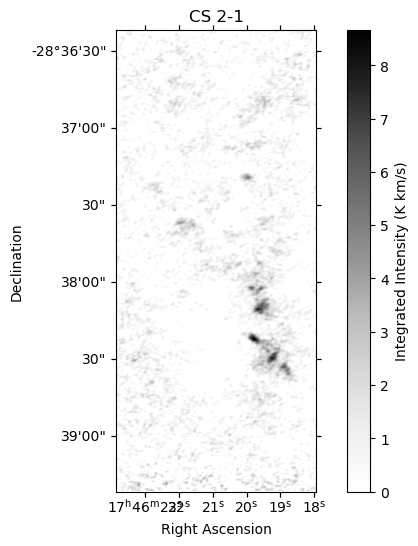

In [28]:
plot_mom0_cutout(pos_ctr, l, w, line='CS 2-1', vmin=-56*u.km/u.s, vmax=-52*u.km/u.s)

## Lines detected in Filament


CS 2-1

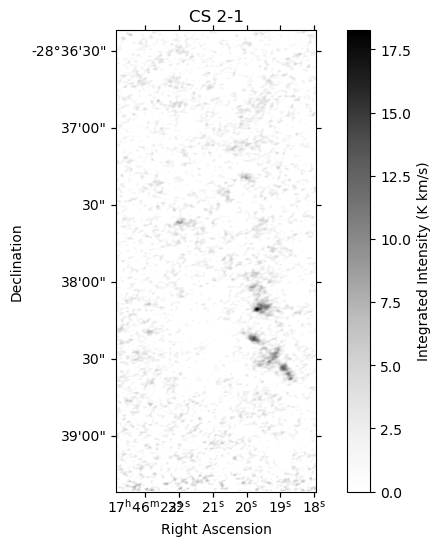

In [29]:
mom0_CS = plot_mom0_cutout(pos_ctr, l, w, line='CS 2-1', vmin=-62*u.km/u.s, vmax=-46*u.km/u.s)
#vmin=-56*u.km/u.s, vmax=-52*u.km/u.s)
#mom0_CS.write('/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_B3_CS_n56_n52.fits', overwrite=True)

HNCO 4-3

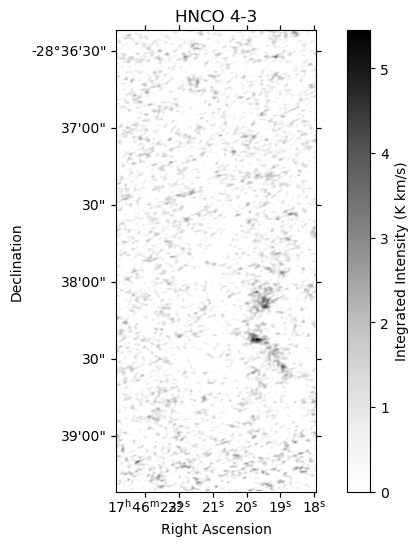

In [30]:
mom0_HNCO = plot_mom0_cutout(pos_ctr, l, w, line='HNCO 4-3', vmin=-56*u.km/u.s, vmax=-52*u.km/u.s)
#mom0_HNCO.write('/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_B3_HNCO_n56_n52.fits', overwrite=True)

HCO+ 1-0

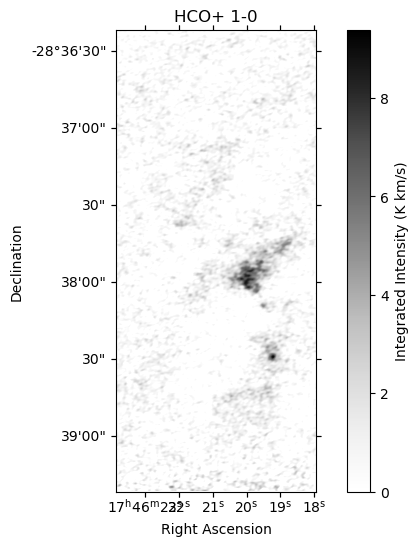

In [31]:
mom0_HCOp = plot_mom0_cutout(pos_ctr, l, w, line='HCO+ 1-0', vmin=-56*u.km/u.s, vmax=-52*u.km/u.s)
#mom0_HCOp.write('/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_B3_HCOp_n56_n52.fits', overwrite=True)

SiO 2-1

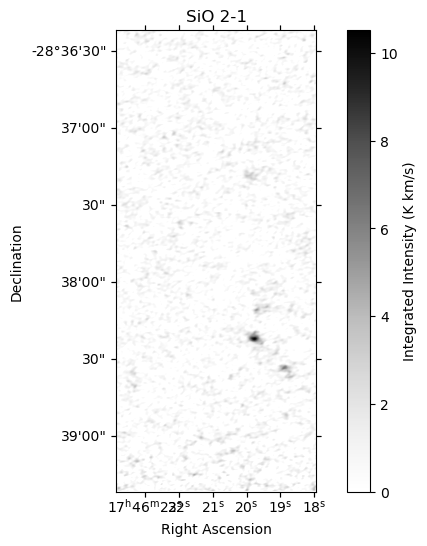

In [32]:
mom0_SiO = plot_mom0_cutout(pos_ctr, l, w, line='SiO 2-1', vmin=-56*u.km/u.s, vmax=-52*u.km/u.s)
#mom0_SiO.write('/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_B3_SiO_n56_n52.fits', overwrite=True)

H13CO+ 1-0

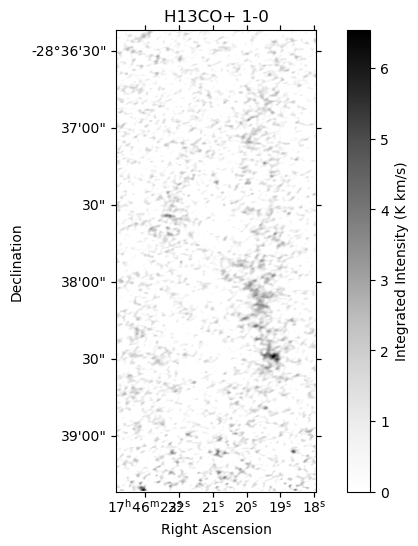

In [33]:
mom0_H13COp = plot_mom0_cutout(pos_ctr, l, w, line='H13CO+ 1-0', vmin=-56*u.km/u.s, vmax=-52*u.km/u.s)
#mom0_H13COp.write('/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_B3_H13COp_n56_n52.fits', overwrite=True)

HN13C 1-0

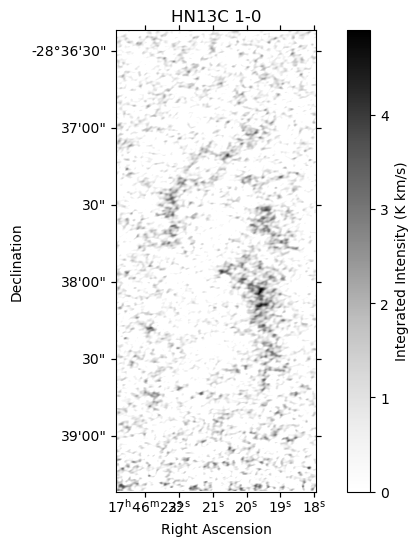

In [34]:
mom0_HN13C = plot_mom0_cutout(pos_ctr, l, w, line='HN13C 1-0', vmin=-56*u.km/u.s, vmax=-52*u.km/u.s)
#mom0_HN13C.write('/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_B3_HN13C_n56_n52.fits', overwrite=True)

SO 3(2)-2(1)

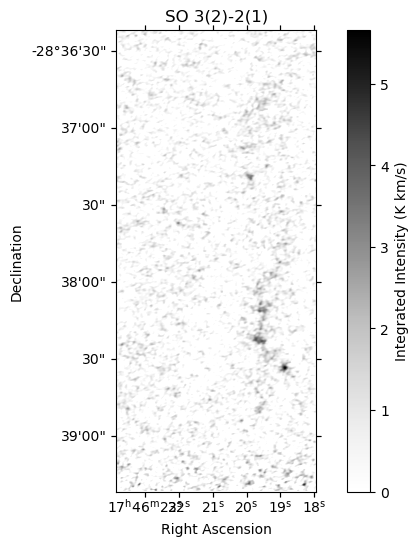

In [35]:
mom0_SO31_21 = plot_mom0_cutout(pos_ctr, l, w, line='SO 3(2)-2(1)', vmin=-56*u.km/u.s, vmax=-52*u.km/u.s)
#mom0_SO31_21.write('/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_B3_SO32_21_n56_n52.fits', overwrite=True)

SO 2(2)-1(1)

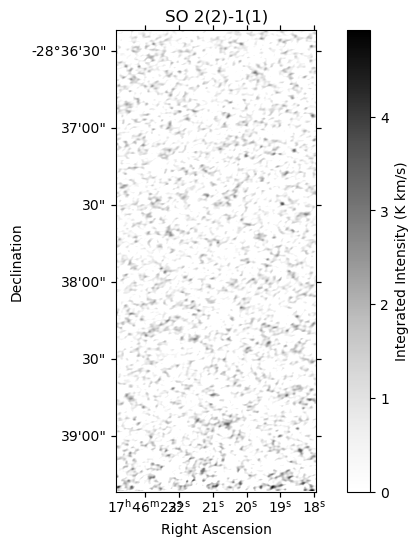

In [36]:
mom0_SO22_11 = plot_mom0_cutout(pos_ctr, l, w, line='SO 2(2)-1(1)', vmin=-56*u.km/u.s, vmax=-52*u.km/u.s)
#mom0_SO22_11.write('/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_B3_SO22_11_n56_n52.fits', overwrite=True)

34SO 3(2)–2(1)

In [37]:
plot_mom0_cutout(pos_ctr, l, w, line='34SO 3(2)–2(1)', vmin=-56*u.km/u.s, vmax=-52*u.km/u.s)

IndexError: index 0 is out of bounds for axis 0 with size 0

HC3N 11-10

In [ ]:
mom0_HC3N = plot_mom0_cutout(pos_ctr, l, w, line='HC3N 11-10', vmin=-56*u.km/u.s, vmax=-52*u.km/u.s)
#mom0_HC3N.write('/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_B3_HC3N_n56_n52.fits', overwrite=True)

H13CN 1-0

In [ ]:
mom0_H13CN = plot_mom0_cutout(pos_ctr, l, w, line='H13CN 1-0', vmin=-56*u.km/u.s, vmax=-52*u.km/u.s)
#mom0_H13CN.write('/orange/adamginsburg/jwst/cloudc/alma/moments/mom0_B3_H13CN_n56_n52.fits', overwrite=True)

# PV Diagrams

In [38]:
whole_pv_CS = fits.open('/orange/adamginsburg/ACES/mosaics/cubes/moments/CS21_CubeMosaic_PV_max.fits')

In [39]:
from matplotlib.patches import Rectangle


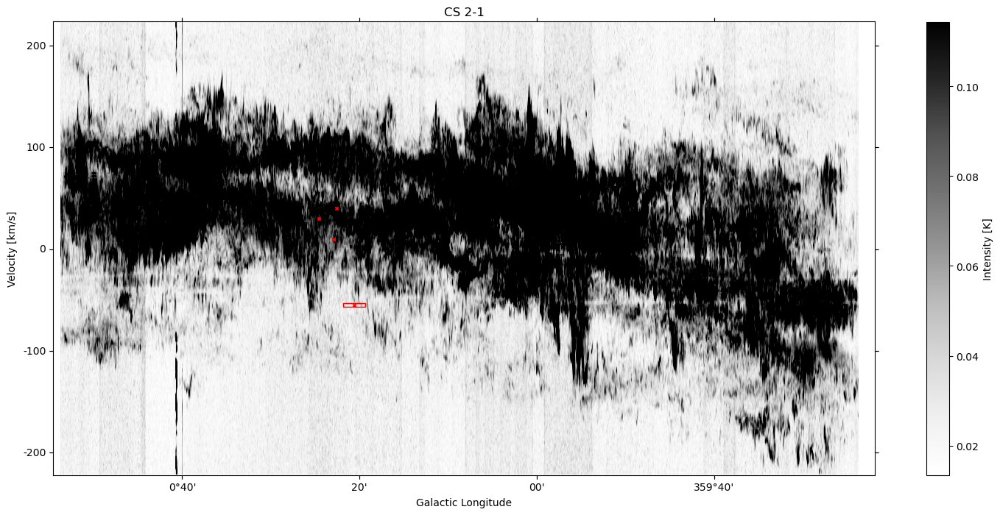

In [136]:
fig = plt.figure(figsize=(18, 8))
ax = plt.subplot(111, projection=WCS(whole_pv_CS[0].header))
norm = simple_norm(whole_pv_CS[0].data, stretch='linear', min_percent=1, max_percent=80)
im = ax.imshow(whole_pv_CS[0].data, cmap='Greys', norm=norm)

ax.scatter(pos_ctr.galactic.l, (-55*u.km/u.s).to(u.m/u.s), transform=ax.get_transform('world'), marker='x', color='red', s=10)

ax.scatter(pos_cloudc1.galactic.l, (40*u.km/u.s).to(u.m/u.s), transform=ax.get_transform('world'), marker='x', color='red', s=10)
ax.scatter(pos_cloudc2.galactic.l, (10*u.km/u.s).to(u.m/u.s), transform=ax.get_transform('world'), marker='x', color='red', s=10)
ax.scatter(pos_cloudd.galactic.l, (30*u.km/u.s).to(u.m/u.s), transform=ax.get_transform('world'), marker='x', color='red', s=10)


ax1 = ax.coords[1]
ax1.set_format_unit(u.km/u.s)

#reg = regions.RectangleSkyRegion(pos_ctr.galactic.l, 2.5*u.arcmin, (4*u.km/u.s).to(u.m/u.s))
#pixel_region = reg.to_pixel(WCS(whole_pv_CS[0].header))
#pixel_region.plot(ax=ax, color='red', linewidth=0.5)

rect = Rectangle((pos_ctr.galactic.l.value-(2.5*u.arcmin).to(u.deg).value/2, (-57*u.km/u.s).to(u.m/u.s).value), 
                 (2.5*u.arcmin).to(u.deg).value, (4*u.km/u.s).to(u.m/u.s).value, 
                 linewidth=1, edgecolor='r', facecolor='none', transform=ax.get_transform('world'))
ax.add_patch(rect)

ax.set_xlabel('Galactic Longitude')
ax.set_ylabel('Velocity [km/s]')
ax.set_title('CS 2-1')

ax.set_aspect('auto')

cbar = plt.colorbar(im)
cbar.set_label('Intensity [K]')

In [ ]:
#rect = patches.Rectangle((50, 100), 40, 30, linewidth=1, edgecolor='r', facecolor='none')
pos_ctr.galactic.l

In [41]:
spec_tab = Table.read(f'{basepath}/analysis/linelist.csv')
lines = spec_tab['Line']
mol = spec_tab[spec_tab['Line']=='CS 2-1']
spw = mol['12m SPW'][0]
fn = f'/orange/adamginsburg/jwst/cloudc/alma/ACES/uid___A001_X15a0_X1a8.s38_0.Sgr_A_star_sci.spw{spw}.cube.I.iter1.image.pbcor.fits'
mom0_CS = get_moment0(mol['Rest (GHz)']*u.GHz, -56*u.km/u.s, -52*u.km/u.s, fn)
mom0_CS_cutout = get_mom0_cutout(pos_ctr, l, w, mom0_CS)

cube = SpectralCube.read(fn)
subcube = cube.with_spectral_unit(u.km/u.s, velocity_convention='radio', rest_value=mol['Rest (GHz)']*u.GHz).spectral_slab(-100*u.km/u.s, 0*u.km/u.s)

In [42]:
subcube.allow_huge_operations = True
subcube = subcube.to(u.K)

In [43]:
from pvextractor import extract_pv_slice, Path

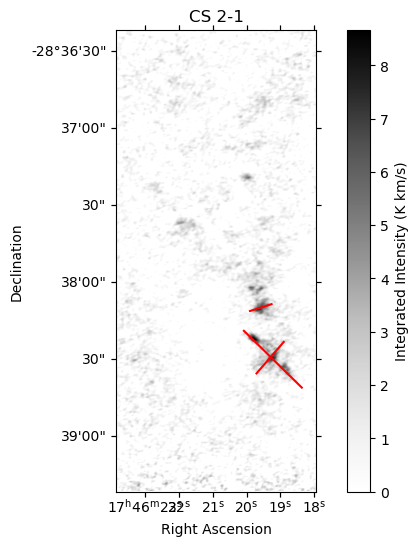

In [44]:
fig = plt.figure(figsize=(8,6))
ax = plt.subplot(111, projection=mom0_CS_cutout.wcs)
im = ax.imshow(mom0_CS_cutout.data, cmap='Greys', vmin=0)

path1 = Path(SkyCoord(['17:46:20.0850627858', '17:46:18.3556101301'], ['-28:38:19.0294725036', '-28:38:41.3496024714'], unit=(u.hourangle, u.deg)))
path1.show_on_axis(ax, spacing=1, color='r')

path2 = Path(SkyCoord(['17:46:18.8955905800', '17:46:19.7143068392'], ['-28:38:23.3620017785', '-28:38:35.8113444981'], unit=(u.hourangle, u.deg)))
path2.show_on_axis(ax, spacing=1, color='r')

path3 = Path(SkyCoord(['17:46:19.2548767072', '17:46:19.9161884949'], ['-28:38:08.6882920122', '-28:38:11.4465321463'], unit=(u.hourangle, u.deg)))
path3.show_on_axis(ax, spacing=1, color='r')

ax.set_xlabel('Right Ascension')
ax.set_ylabel('Declination')
ax.set_title(mol['Line'].value[0])

cbar = plt.colorbar(im)
cbar.set_label('Integrated Intensity (K km/s)')


In [45]:
pvdiagram1 = extract_pv_slice(cube=subcube, path=path1, spacing=1)


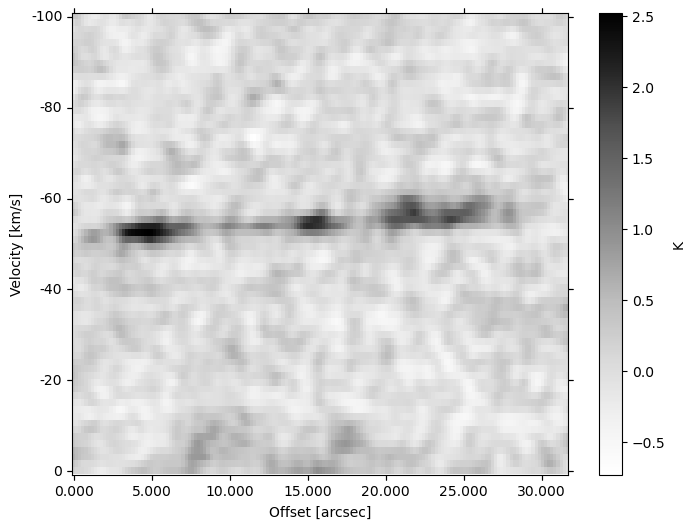

In [46]:
fig = plt.figure(figsize=(8,6))
ax = plt.subplot(111, projection=WCS(pvdiagram1.header))
im = ax.imshow(pvdiagram1.data, cmap='Greys', aspect='auto')
cb = plt.colorbar(mappable=im)
cb.set_label(subcube.unit)

ax1 = ax.coords[1]
ax1.set_format_unit(u.km/u.s)
ax0 = ax.coords[0]
ax0.set_format_unit(u.arcsec)

ax.set_xlabel('Offset [arcsec]')
ax.set_ylabel('Velocity [km/s]')


In [47]:
pvdiagram2 = extract_pv_slice(cube=subcube, path=path2, spacing=1)


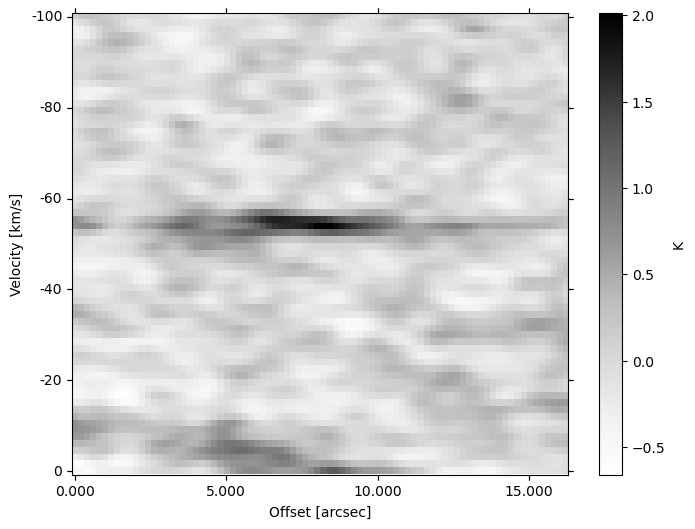

In [48]:
fig = plt.figure(figsize=(8,6))
ax = plt.subplot(111, projection=WCS(pvdiagram2.header))
im = ax.imshow(pvdiagram2.data, cmap='Greys', aspect='auto')
cb = plt.colorbar(mappable=im)
cb.set_label(subcube.unit)

ax1 = ax.coords[1]
ax1.set_format_unit(u.km/u.s)
ax0 = ax.coords[0]
ax0.set_format_unit(u.arcsec)

ax.set_xlabel('Offset [arcsec]')
ax.set_ylabel('Velocity [km/s]')


In [49]:
pvdiagram3 = extract_pv_slice(cube=subcube, path=path3, spacing=1)


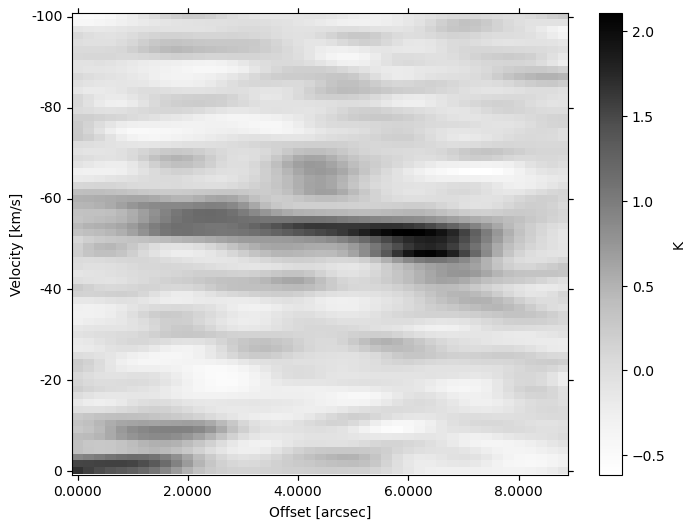

In [50]:
fig = plt.figure(figsize=(8,6))
ax = plt.subplot(111, projection=WCS(pvdiagram3.header))
im = ax.imshow(pvdiagram3.data, cmap='Greys', aspect='auto')
cb = plt.colorbar(mappable=im)
cb.set_label(subcube.unit)

ax1 = ax.coords[1]
ax1.set_format_unit(u.km/u.s)
ax0 = ax.coords[0]
ax0.set_format_unit(u.arcsec)

ax.set_xlabel('Offset [arcsec]')
ax.set_ylabel('Velocity [km/s]')


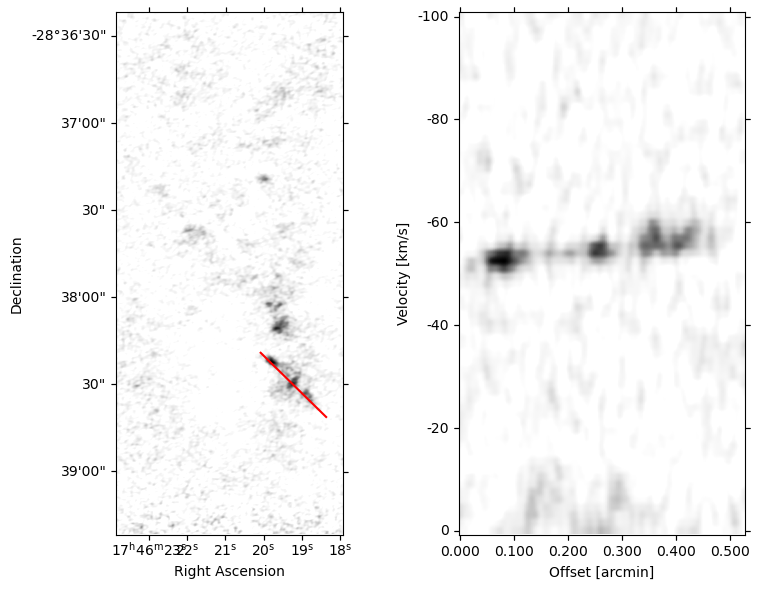

In [92]:
fig = plt.figure(figsize=(8, 6))

ax1 = plt.subplot(121, projection=mom0_CS_cutout.wcs)
ax1.imshow(mom0_CS_cutout.data, cmap='Greys', vmin=0)

path1 = Path(SkyCoord(['17:46:20.0850627858', '17:46:18.3556101301'], ['-28:38:19.0294725036', '-28:38:41.3496024714'], unit=(u.hourangle, u.deg)))
path1.show_on_axis(ax1, spacing=1, color='r')

ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(122, projection=WCS(pvdiagram1.header))
ax2.imshow(pvdiagram1.data, cmap='Greys', vmin=0)

ax2.coords[1].set_format_unit(u.km/u.s)
ax2.coords[0].set_format_unit(u.arcmin)
ax2.set_xlabel('Offset [arcmin]')
ax2.set_ylabel('Velocity [km/s]')

ax2.set_aspect('auto')

plt.tight_layout()

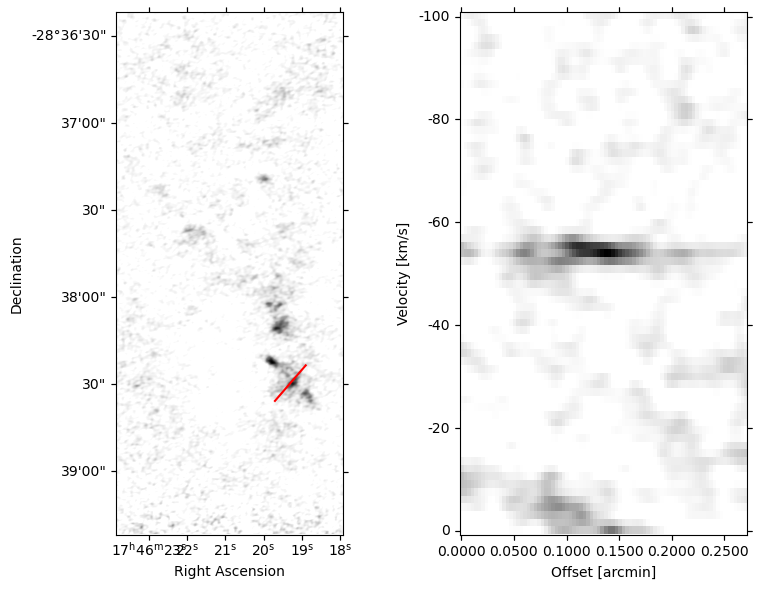

In [93]:
fig = plt.figure(figsize=(8, 6))

ax1 = plt.subplot(121, projection=mom0_CS_cutout.wcs)
ax1.imshow(mom0_CS_cutout.data, cmap='Greys', vmin=0)

path2.show_on_axis(ax1, spacing=1, color='r')

ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(122, projection=WCS(pvdiagram2.header))
ax2.imshow(pvdiagram2.data, cmap='Greys', vmin=0)

ax2.coords[1].set_format_unit(u.km/u.s)
ax2.coords[0].set_format_unit(u.arcmin)
ax2.set_xlabel('Offset [arcmin]')
ax2.set_ylabel('Velocity [km/s]')

ax2.set_aspect('auto')

plt.tight_layout()

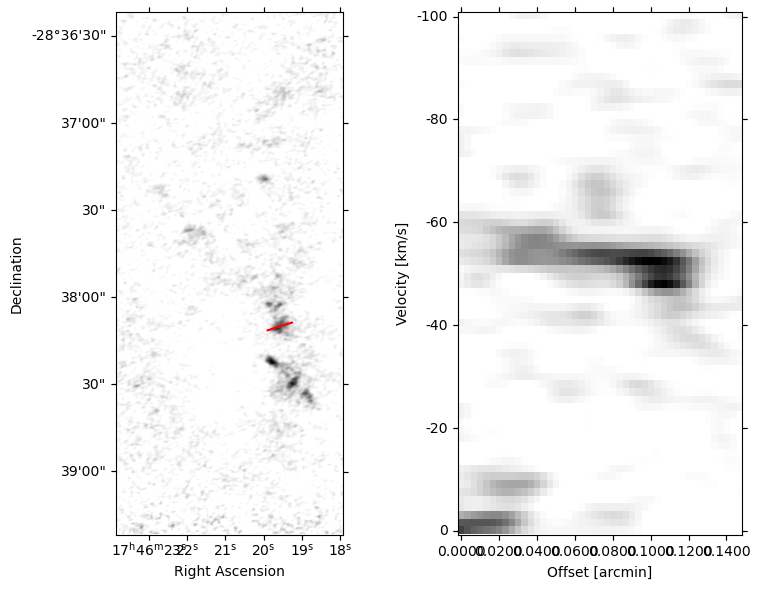

In [94]:
fig = plt.figure(figsize=(8, 6))

ax1 = plt.subplot(121, projection=mom0_CS_cutout.wcs)
ax1.imshow(mom0_CS_cutout.data, cmap='Greys', vmin=0)

path3.show_on_axis(ax1, spacing=1, color='r')

ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(122, projection=WCS(pvdiagram3.header))
ax2.imshow(pvdiagram3.data, cmap='Greys', vmin=0)

ax2.coords[1].set_format_unit(u.km/u.s)
ax2.coords[0].set_format_unit(u.arcmin)
ax2.set_xlabel('Offset [arcmin]')
ax2.set_ylabel('Velocity [km/s]')

ax2.set_aspect('auto')

plt.tight_layout()

In [ ]:
#2.5 * u.arcmin
#-56 * u.km/u.s
#-52 * u.km/u.s

# CMD of the Filament

In [95]:
basetable = Table.read(f'{basepath}/catalogs/basic_merged_photometry_tables_merged_bgsub_blur.fits')


In [96]:
mas_405 = np.logical_or(np.array(basetable['qfit_f405n'])<0.4, np.isnan(np.array(basetable['mag_ab_f405n'])))
mas_410 = np.logical_or(np.array(basetable['qfit_f410m'])<0.4, np.isnan(np.array(basetable['mag_ab_f410m'])))
mask = np.logical_and(mas_405, mas_410)
mas_466 = np.logical_or(np.array(basetable['qfit_f466n'])<0.4, np.isnan(np.array(basetable['mag_ab_f466n'])))
mask = np.logical_and(mask, mas_466)
mas_187 = np.logical_or(np.array(basetable['qfit_f187n'])<0.4, np.isnan(np.array(basetable['mag_ab_f187n'])))
mask = np.logical_and(mask, mas_187)
mas_182 = np.logical_or(np.array(basetable['qfit_f182m'])<0.4, np.isnan(np.array(basetable['mag_ab_f182m'])))
mask = np.logical_and(mask, mas_182)
mas_212 = np.logical_or(np.array(basetable['qfit_f212n'])<0.4, np.isnan(np.array(basetable['mag_ab_f212n'])))
mask = np.logical_and(mask, mas_212)

In [97]:
tbl_use = basetable[mask]
crds_use = tbl_use['skycoord_ref']

In [124]:
fn_405 = '/orange/adamginsburg/jwst/cloudc/images/F410_reproj_merged-fortricolor.fits'
#'/orange/adamginsburg/jwst/cloudc/images/jw02221-o002_t001_nircam_clear-f405n-merged_i2d.fits'
ww = WCS(fits.open(fn_405)[0].header)

In [126]:
filament_reg = regions.Regions.read(f'{basepath}/regions_/filament_short.reg')
tbl_in = tbl_use[filament_reg[0].contains(crds_use, wcs=ww)]
crds_in = crds_use[filament_reg[0].contains(crds_use, wcs=ww)]

In [129]:
color_182_212 = tbl_use['mag_ab_f182m'] - tbl_use['mag_ab_f212n']
color_405_410 = tbl_use['mag_ab_f405n'] - tbl_use['mag_ab_f410m']
mag_182 = tbl_use['mag_ab_f182m']

color_in_182_212 = tbl_in['mag_ab_f182m'] - tbl_in['mag_ab_f212n']
color_in_405_410 = tbl_in['mag_ab_f405n'] - tbl_in['mag_ab_f410m']
mag_in_182 = tbl_in['mag_ab_f182m']

(0.0, 3.0)

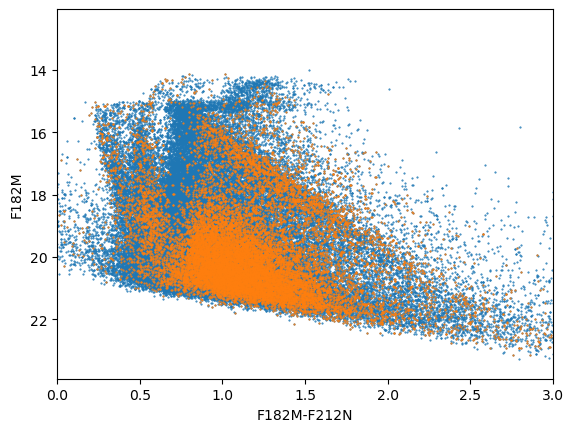

In [132]:
ax = plt.subplot(111)
ax.scatter(color_182_212, mag_182, s=1, marker='.')
ax.scatter(color_in_182_212, mag_in_182, s=1, marker='.')
plt.gca().invert_yaxis()
ax.set_xlabel('F182M-F212N')
ax.set_ylabel('F182M')
plt.xlim(left=0, right=3)